## Brute force approximation
We begin our notebook by implementing the physics equations necessary for our N-body simulation.

In [1]:
using BenchmarkTools
g = 6.673e-11 #N m^2/kg^2
solar_mass = 1.98892e30
versioninfo()

Julia Version 1.5.3
Commit 788b2c77c1 (2020-11-09 13:37 UTC)
Platform Info:
  OS: Linux (x86_64-pc-linux-gnu)
  CPU: Intel(R) Core(TM) i9-9980HK CPU @ 2.40GHz
  WORD_SIZE: 64
  LIBM: libopenlibm
  LLVM: libLLVM-9.0.1 (ORCJIT, skylake)


In [2]:
function calc_v(v, a, delta_t)
    return (v .+ a*delta_t)
end

function calc_pos(pos, v, delta_t)
    return (pos .+ v*delta_t)
end
    
function calc_acc(x, y, mass, soft)
    delta_x = transpose(x) .- x
    delta_y = transpose(y) .- y
    r = sqrt.(delta_x.^2 .+ delta_y.^2 .+ soft^2)
    ax = g * (delta_x ./ r.^3) * mass
    ay = g * (delta_y ./ r.^3) * mass
    return ax, ay
end

calc_acc (generic function with 1 method)

In [3]:
using GR
GR.inline("mov")
#x coord, y coord, x vel, y vel, body mass, img file
#delta_t = 25000
#n = 2
function brute_force(univ, delta_t, n, univ_r, soft, animation_name, frame_rate, plot)
    #anim = Animation()
    @inbounds for j = 1:n
        if j%frame_rate == 0 && plot
            p = GR.scatter(univ[: , 1], univ[: , 2], ylim = (-univ_r, univ_r), xlim = (-univ_r, univ_r))  #,framestyle=:origin, yformatter=y->round(Int64, y/univ_r), xformatter=x->round(Int64, x/univ_r))
            #frame(anim)
        end
        x, y = univ[:, 1], univ[:, 2]
        vx, vy = univ[:, 3], univ[:, 4]
        mass = univ[:, 5]
        ax, ay = calc_acc(x, y, mass, soft)
        vx1, vy1 = calc_v(vx, ax, delta_t), calc_v(vy, ay, delta_t)
        x1, y1 = calc_pos(x, vx1, delta_t), calc_pos(y, vy1, delta_t)
        univ = hcat(x1, y1, vx1, vy1, mass)
    end
    return univ
    #gif(anim, animation_name)
end

brute_force (generic function with 1 method)

The function create_bodies is modeled after the explanation provided by Frans Pretorius and Tim Koby. It uses the plummer model to create a toy universe, this model is denser at the center.  https://physics.princeton.edu/~fpretori/Nbody/

In [3]:
function create_bodies(n, univ_radius, soft)
    #initialize random position of all particles
    px = univ_radius*ℯ^(-1.8) .* (.5 .- rand(n))
    py = univ_radius*ℯ^(-1.8) .* (.5 .- rand(n))
    #use positions to get randomized circular velocities
    r = sqrt.(px.^2 .+ py.^2 .+ soft^2)
    v = sqrt.((g*1e6*solar_mass) ./ (r))
    theta = atan.(abs.(py./px))
    thetav = π/2 .- theta
    orientation = sign.(.5 .- rand(n))
    vx = (-1 .* sign.(py) .* cos.(thetav).*v) .* orientation
    vy = (      sign.(px) .* sin.(thetav).*v) .* orientation
    #randomize mass based on the solar mass
    mass = 1e20 .+ rand(n) .* 10 .* solar_mass
    #option to add color based on mass
    #add large mass at center
    center_mass = [0 0 0 0 1e6*solar_mass]
    #indexes to help when traversing the tree
    indexes = 1:n+1
    return_univ = hcat(px, py, vx, vy, mass)
    return_univ = vcat(center_mass, return_univ)
    return_univ = hcat(return_univ, indexes)
    return return_univ
end

create_bodies (generic function with 1 method)

A test of our brute force method (ensuring the physics works)

In [5]:
soft = 3e4
n_univ = create_bodies(10, 1e18, soft)
#@show n_univ
fr = 10
brute_force(n_univ, 1e11, 1000, 1e18, soft, "n_univ.gif", fr)
GR.show()
#TODO: ADD SOFTENING FACTOR, MAKE CIRCLES SMALLER, CREATE OCTREE

GR.HTML("<video autoplay controls><source type=\"video/mp4\" src=\"data:video/mp4;base64,AAAAFGZ0eXBxdCAgAAACAHF0ICAAAAAId2lkZQAGAU1tZGF0AAAFWmW4AAQAABOTFAAELSTk5OTk5OTk5OTk5OTk5OTk5OTk5OTk5OTk5OTk5OTk5OTk5OTk5OTk5OTk5OTk5OTk5P4f/w9gcAAiAAwCUHXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXW66/+/sAYU4Q7awBRZhKXVDcr97AGp4G8DNfjp+IJbwQZ7LWFn8HzDmPMO+GjZMjYO/AFaMyRvwBgA7P2wnkLb6kgK20ARNCXf3V6VJusxhpN+u0YSJJn/j18XvfzYBF2I9CENv4E3pBwJuN1vrlm5EAFhxSxSIRkOUGlACOAEgzPcRWK50DpR3T1sq86i1vTiTGw37uhCI2RCkOcL6OP1nS8+agtgTfDqiMxIteAk9Q8JrFte9YBQW0RTGqJ6CLXiWwIXfeckyRmZtTCdQHvbrGSmFPfeEgADgAiYA1P2ErXWKdmfFkYYy3//5uf0/CL4BH133eHh77womBSX+fexkPVxxl+AODDABIBry4f//4V8AdrbJ4+4///4btnvj///m02vj///zib4///8NcX/x/BBw93t8f//Drjfvj//4aTlfvj//57++P//x0Y/vj//89++P//+HXG3x///w0nK3x///whb7b4///8tj//5NJuTSaP///Hv//H8EHObvj//5b++P//nVffH//w3xv3x//+W/fH//5RB8fgARH6r+v//NQDjCl//Hngh4AK3kzVG23rrrrrr/zX/h+AWA1DFSOpMDGdlo8zwqj6P67Dn6ndcA/4S44D8sEhFtxu+AnhVsekU4TGq8g4/X9U179C2FxLV6f/1t8pILNX5gk25tt3zgAN/8Jfgz9PylX/FEzo0I8GBAHksk7ikRfYTRvGvA4egsLrfaEAU//hKHBplUEU7HEIWZ+354OlLnD2UUSu1RMjBTrqA2+XHG6t5EJE+cWCwmRBv6tpR//FbGKwibSKrngijwPABcTP4DuIiZvUfgAJph7fEFYi0sb4cAAyAjrmAVHoYpk50Of+z5n3x+AItAucRr88DgEKZcDgCFNuAFLjRiqscB382Y6rnP57V3k5aj8ABJoL5cURqNWxvwOAAYAR9yAUFqQhl51Of0fI94ulLRjn/Dh/ALxGNUBlFF+hX+C5xG4Px4AAgJAAYADgCEtwJBFhA2jhA2oJBDhA2jhA2/79xD8QgHCcHQGAOFpnwibH4dGtN58H4APth//lFam0taHAAQCdcwDooEokWuvz/4VF98fgARx222w+UVoHACCjLgcE49wAotDQpK5jgzjs9mZ/7Q80Pvj8ABJILf8gjE2lrYcAA4EF3IBEFOhmLzlOf/Dcqbn74/AASSBb/mEYu0tbA4ADgGuQDoqOBc5vP/zX3tXGH8MMVgYk0zjwBBwvqZPCP7fGo1TN8fgAJph7fEFYi0sb54AAgBPgHghLXHP+FRXx+ABFBk0Q2JyiN8OABAoVcDpjuAFFoNCm5RDkd/z37Q80Ly8fgAJNAvlxxGq1bG/A4ABJgHuQDhcLH5z+f7u8Ouaj8ABJoL5cURqNSxfw4ABkYVcgFRzIVCcVRz+zEzA/BwACAQFDktyyC0HILcHILQcgt/8Y+H84UwHIYiUzfZf+JAAcJwcABAo/yZ8In3dgQjU2D7yYPwAE2w//yitTaWtA4BANtzAOUCwk2ufz/4VF98fgA+2H/+U5y8orQ4Q4ZcwDWPOJa3Gf+0JoffH4ACSQW/5BGJtLWwOGgFuQMUD5xdL/9398fgAJJBb/kEYm0tbA4ABsCFXIBGHIQ5G52Of/JcrLn7/gH/7wHACCilUzjP/AdIyTMZJJmuuuvAAAElWUBquAAEAAATkxQABC0k5OTk5P/APhCFIDkwABAHAOmdgNrZI34GB6vjsEiDJoI8ub7/9FOMtDyK2jAY/AeNSS3llrZetlrZZESSw8SS/DxJLDxJL8fhxTPmfmf+OXdz74/L/V1f9XCGIaf59PvPp9x+GlM+R8j/kfI95NZD8NKZ9a/WrxQACF/h/wAcJwOjWndof88vj8PqYiovoqL74/PzQzQ+s0Pvj8MqZGblrH5WIzc++Pwypla/Wvv/wj/ivcDUapnfPh73ksfhxTPRUX0VFfH4cUzzQzQ+aE0L4/DSmfe/3uEMtP8+n3n0+4/DSmfMxMx8zEzDyYAsh+GlM+aE0PmhNDh+GAcJxqcmfx/33lsfh9TEVF9FRffH4fUw0M0PrND74/DKmXv97++PwypkcuXP/M+OXPv+HiEPicBwI5T0wAbWyTfgj8YnnuHgCHEmEz/gN5BklgjSUNv6rmhHWIM0MGMmpOT+H/8PYHAAIgAMAlB1111111111x+X+rq/q6uuuuuuuutR+H1MRUX0VF98fn5oTQ+aE0PvrV8fhlTK1+tffWhrrrrrrrrrrrF1111111111mULrrrddddddf4B/8PwAbhjJiucthd8AMa2RkmTaGnWGOz+yxZlqZfqZamX/+P0imfRTP+Z8z74/L/1f1dXHYfZYZlqZfqZamX/+P0SmfopH/I+R47D7LDMtTL9TLUy//x2nZZTLUy/Uy//47D7LDMtTL9TLUy//347H2qCGZfUy1Mv/9+Pw+piKi+iovvj8/WaHzQmh98dh9lhmX8ZlqZf/78fhlTK1+tffHYfZYZlsNcYlKZf/47TssplqZfqZamX/+O07LKZamX7DQzL/+/H4cUz1mh80JoXx+GlM+9/vcdh9lhmWpl+plqZf/4/RKZ+xzMfMxMwOw+ywzLUy/Uy1Mv/8folM/NCaHzQmgOw+yxDQzL9TLUy//347D7LJDMvqZamX/+/H4fUxZofNCaH3x2H2WGZfxmWpl//vx2H2WGZcC4zLUy//38cA//D0ADE4MRMxzEsJ/3rtk1EH7hFhjTK66666666647ABDYEc8OYxj/8//ABqEF+ZhanMQBcpMwAe/RBDP8Mdhxlv8uS1kv1ktZL8fhxTPM+Z/6KZ98fl/q6v+rjsOMt/jktZL9ZLWS/H4aUz5HyP/RSPHYcZb/HJayX6yWsl+Ow4y3+slrJfrJdC47DjLf45LWS/WS1kv3x2HGW/2EOS+slrJfvj8PqYiovoqL74/PzQmh/ND747DjLf45LoXHJayX74/DKmVr9a++Ow4y3+OS1kv1kiyX47DjLf6yWsl+slrJfjsOMt/rJayX9CHJffH4cUzzQmh9ZoXx+GlM+9/vcdhxlv8clrJfrJayX4/DSmfMxMx+szA7DjLf45LWS/WS1kvx+GlM+aE0PzQmgOw4y3+YyOS/WS1kv3x2HGW/2EOS+slrJfvj8PqYaE0PrND747DjLf45LoXHJayX747DjLf45LoXHJayX747AAguDOayGMY4v+ACJBD/MwtDmPARqzAB73IMdvhh9dddeAAABf1lANS4AAQAABOTFAAELSTk5OTk/8P/D8ByYAAgDgHTO+ThDDimeZ+Z/zPmfJwhl/q6v6urkxRhDDSmfI+R/yPkeTLwhhpTPrX61JigAEJPw//w9A6NafJwhh9TEVF9FRfJwhn5oZofNCaHycIYZUyM3Km5/U3Km5+ThDDKmVr9a+T/w/8PwNRqmd8moQw4pnoqL6Kik4Qw4pnmhmh80JoScIYaUz73+9ybhDDSmfMxMx8zEzBMsAwhhpTPmhND5oTQ4f/4ejU5M/k3CGH1MRUX0VF8nCGH1MNDND5oTQ+ThDDKmXv97+ThDDKmRy5WXP6y5WXPyfw//hLAcCOU9M48AQ4kwmfyYuTk/h//D2BwACIADAJQddddddcdgBS1gucRvc8AJmJrDikIT4BmUgSrcgUzRQqIZUHzd8+5hnp//jsbwa02hzabf/HZ8Npt82/++Py//9X

# Barnes Hut Algorithm
Our implementation of the Barnes Hut algorithm is done in 2D and therefore we are dealing with quadtrees. We begin by creating a structure that will become our tree, this is explained in the paper Section 4 Algorithm 4.1
The function Update Branches is what creates our Quadtree and explained in the paper in Algorithm 4.2

In [4]:
#takes all of our particles and places particle in it's correct quadrant
#we identify particles based on index
mutable struct Box
    # For dimensions box, if parent bool is true then the subsequent array contains the coordinates to parent boxes
    # and some of their children have children (they're grandparents...)
    # If parent bool is false, then it is only a family of children
    parent::Union{Box, Bool, Array} 
    NW::Union{Box, Array}
    NE::Union{Box, Array}
    SW::Union{Box, Array}
    SE::Union{Box, Array}
end

mutable struct Node
    dimensions::Box   #holds arrays of [x,y] pertaining to corners of the boxes
    particles::Box    #mirrors dimensions box, contains the index of the particle that belongs here
    masses::Box       #mirrors dimensions box, contains total mass of particles in this box
end

function FindDirection(posx, posy, dims)
    # takes in position of particle and the dimensions box
    # returns name of coordinate box it belongs in
    nw, ne, sw, se = dims.NW, dims.NE, dims.SW, dims.SE
    center = [(nw[1] + ne[1])/2 , (nw[2] + sw[2])/2]
    if posx <= center[1]
        if posy >= center[2]
            return Symbol("NW")
        else
            return Symbol("SW")
        end
    else
        if posy >= center[2]
            return Symbol("NE")
        else
            return Symbol("SE")
        end
    end
end

function IsInBox(posx, posy, dims)
    #first check if it belongs in box, then check if there's any children in the box
    #if there's a particle in there then split box and reassign particle
    nw, ne, sw, se = dims.NW, dims.NE, dims.SW, dims.SE
    center = [(nw[1] + ne[1])/2 , (nw[2] + sw[2])/2]
    if posx >= nw[1] && posx <= ne[1] && posy >= sw[2] && posy <=nw[2]
        return true
    else
        return false
    end
end

    
function SplitBox(dims)
    nw, ne, sw, se = dims.NW, dims.NE, dims.SW, dims.SE
    center = [(nw[1] + ne[1])/2 , (nw[2] + sw[2])/2]
    nnw = Box(false, nw, [center[1], nw[2]], [nw[1], center[2]], center)
    nne = Box(false, [center[1], ne[2]], ne, center, [ne[1], center[2]])
    nsw = Box(false, [sw[1], center[2]], center, sw, [center[1], sw[2]])
    nse = Box(false, center, [se[1], center[2]], [center[1], se[2]], se)
    return nnw, nne, nsw, nse
end


#change update masses to store everything thats in that box (in univ format... and then calculate com at point of contact I guess)
# update the parent paramater of our masses to contain all the particles in that node
directions = ["NW", "NE", "SW", "SE"]
function UpdateMasses(masses, particles)
    #recursively travel through tree and update each parent node with an array that contains all
    #particles in that node
    #this will be used to calculate the center of mass on the fly for when we need it
    #honestly, I find it weird that it works
    total_mass = Array{Float64, 2}[]
    if masses.parent == true
        for dir in directions
            curr_mass = getproperty(masses, Symbol(dir))
            curr_par = getproperty(particles, Symbol(dir))
            if curr_mass.parent == true
                total_masses = UpdateMasses(curr_mass, curr_par)
                if isempty(total_mass)
                    total_mass = total_masses
                else
                    total_mass = vcat(total_mass, total_masses)
                end
            elseif curr_mass.parent == false
                continue
            else
                if isempty(total_mass)
                    total_mass = curr_par.parent
                else
                    total_mass = vcat(total_mass, curr_par.parent)
                end
            end
        end
    end
    setproperty!(masses, :parent, total_mass)
end

function UpdateBranches(dimensions, particles, masses, univ)
    # univ is an array(5xn) containing particles in the form of:
    # x_pos, y_pos, xvel, yvel, mass
    # because we are dealing with squares, we only need to store the corners in our dimensions branch
    # the rest we calculate on the fly
    @inbounds for i in 1:size(univ, 1)
        particle = reshape(univ[i , :], (1,6))
        #update the tree with what we want to insert in it
        posx, posy = particle[1:2]
        mass = particle[5]
        #check that we are in this box or in this universe
        #if particle has left our universe radius, we can pretend it doesn't exit
        if dimensions.parent == false
            isinbox = IsInBox(posx, posy, dimensions)
        else
            isinbox = IsInBox(posx, posy, dimensions.parent)
        end
        if particles.parent == false && isinbox 
            #we have no children, no grandchildren
            # if it's a bool then step 1 is to figure out if it belongs in the box 
            # step 2 is to figure out if there are any children already existing in this box
            # if children exist then we need to split the box
            #thi is our exit condition
            setproperty!(particles, :parent, particle)
            setproperty!(masses, :parent, [mass])
        elseif particles.parent != false && isinbox
            if particles.parent != true #only one particle in this box
                #we have existing children in our box, we need to split our boxes and reassign children
                #first lets split up the box
                new_dimensions_parent = deepcopy(dimensions)
                nnw, nne, nsw, nse = SplitBox(new_dimensions_parent)
                #since we are splitting, turn the current dimensions box into a parent
                new_dimensions_parent.parent = true
                setproperty!(dimensions, :parent, new_dimensions_parent)
                dimensions.NW = nnw; dimensions.NE = nne; dimensions.SW = nsw; dimensions.SE = nse
                #if there's only one particle in the box then find out where that particle belongs 
                existing_par_box = deepcopy(particles)
                existing_par = particles.parent
                new_dir = FindDirection(existing_par[1], existing_par[2], dimensions.parent)
                particles.NW = Box(false, [], [], [], []); particles.NE = Box(false, [], [], [], [])
                particles.SW = Box(false, [], [], [], []); particles.SE = Box(false, [], [], [], [])
                setproperty!(particles, new_dir, existing_par_box)
                setproperty!(particles, :parent, true)
                #now that we have created our new boxes, replicate this design in our masses boxes
                existing_mass_box = deepcopy(masses)
                setproperty!(masses, :parent, true)
                #move the mass of the existing particle to it's new box
                masses.NW = Box(false, [], [], [], []); masses.NE = Box(false, [], [], [], [])
                masses.SW = Box(false, [], [], [], []); masses.SE = Box(false, [], [], [], [])
                setproperty!(masses, new_dir, existing_mass_box)
                #call Update Branches again to place our curent particle, with the new situation
                UpdateBranches(dimensions, particles, masses, particle)
            else
                #since there exists other particles in this parent box let's find out the direction we should be heading in first
                particle_dir = FindDirection(posx, posy, dimensions.parent)
                UpdateBranches(getproperty(dimensions, particle_dir), getproperty(particles, particle_dir), getproperty(masses, particle_dir), particle)
            end
        else #this might be repetitive and unecessary 
            #use the dimensions of the parent tree to pick a branch to explore
            child_direction = FindDirection(posx, posy, dimensions.parent)
            UpdateBranches(getproperty(dimensions, child_direction), getproperty(particles, child_direction),  getproperty(masses, particle_dir), particle)
            continue
        end     
    end
end

UpdateBranches (generic function with 1 method)

In [5]:
#to go through the tree we provide it a constant at which we will consider
#everything away from the current particle as a point constant
#to do this we will use the dimensions of the boxes and their centers for our rs
#and the masses need to be stored so they tell us the total mass inside somewhere

function CalculateCOM(particles)
    #the total masses within box and the center of mass
    #center of mass is calculated with x = (x1m1+x2m2)/(m1+m2)

    x = particles[:, 1]
    y = particles[:, 2]
    m = particles[:, 5]
    tot_m = sum(m)
    xcom = sum(x .* m) ./ tot_m
    ycom = sum(y .* m) ./ tot_m
    return xcom, ycom
end

function CalcR(x1, x2, y1, y2)
    delta_x = x1 .- x2
    delta_y = y1 .- y2
    r = sqrt.(delta_x.^2 .+ delta_y.^2)
    return r
end

function CalcV(v, a, delta_t)
    return (v .+ a*delta_t)
end

function CalcPos(pos, v, delta_t)
    return (pos .+ v*delta_t)
end
    
function CalcAcc(x1, x2, y1, y2, mass, eps)
    delta_x = x2 .- x1
    delta_y = y2 .- y1
    r = sqrt.(delta_x.^2 .+ delta_y.^2 .+ eps^2)
    ax = g * (delta_x ./ r.^3) * mass
    ay = g * (delta_y ./ r.^3) * mass
    return ax, ay
end

#let's go back and use our n_univ as an example
#to update forces we traverse our tree
#TODO: rework masses to be center of mass and not just total mass
function UpdateAcc(tree, dimensions, particles, masses, particle, node_index, total_acc, theta_lim, eps)
    #if particles.parent == true
        #calculate the total force on every single particle... will have to call this twice but with the theta = s/d
        #theta = s/d 
        # s is the size of the box
        # d is the distance r, between current node and center of mass
        #will figure out tomorrow
        #total_force = []
        node = dimensions.parent
        s = node.NE[1] - node.NW[1]
        comx, comy = CalculateCOM(masses.parent)
        d = CalcR(comx, particle[1], comy, particle[2])
        theta = s/d
        if theta > theta_lim
            @inbounds for dir in directions
                curr_particle = getproperty(particles, Symbol(dir))
                curr_dimensions = getproperty(dimensions, Symbol(dir))
                curr_masses = getproperty(masses, Symbol(dir))
                if curr_particle.parent == true
                    UpdateAcc(tree, curr_dimensions, curr_particle, curr_masses, particle, node_index, total_acc, theta_lim, eps)
                elseif curr_particle.parent == false
                    continue
                else
                    curr_particle = curr_particle.parent
                    index = curr_particle[6]
                    x2, y2 = curr_particle[1:2]
                    m2 = curr_particle[5]
                    if index == node_index
                        continue
                    else
                        total_acc .+= CalcAcc(particle[1], x2, particle[2], y2, m2, eps)
                    end
                end
            end
        else
            com_mass = sum(masses.parent[:,5])
            total_acc .+= CalcAcc(particle[1], comx, particle[2], comy, com_mass, eps)
        end
    #end
    return total_acc
end

function CreateTree(univ, univ_r)
    #initiate branches of our tree as childless parents
    #update our branches with our universe
    dimensions_branch  = Box(false, [-univ_r, univ_r], [univ_r, univ_r], [-univ_r, -univ_r], [univ_r, -univ_r])
    particles_branch   = Box(false, [], [], [], [])
    masses_branch      = Box(false, [], [], [], [])
    #combine our updated branches into a tree
    univ_tree          = Node(dimensions_branch, particles_branch, masses_branch)
    UpdateBranches(univ_tree.dimensions, univ_tree.particles, univ_tree.masses,  univ)
    UpdateMasses(univ_tree.masses, univ_tree.particles)
    return univ_tree
end

#@show univ_tree.particles
#@show univ_tree.dimensions
using GR
GR.inline("mov")
function BarnesHut(univ, univ_r, iterations, theta, delta_t, eps, plot)
    @inbounds for j=1:iterations
        tree = CreateTree(univ, univ_r)
        if plot && j%10==1
            s = GR.scatter(univ[: , 1], univ[: , 2], xlim=(-univ_r/2, univ_r/2), ylim=(-univ_r/2, univ_r/2))#, legend=false, framestyle=:origin, yformatter=y->round(Int64, y/univ_r), xformatter=x->round(Int64, x/univ_r))
        end
        next_univ = Array{Float64, 2}[]
        @inbounds for i in univ[:, 6]
            particle = univ[Int(i),:]
            vx, vy = particle[3:4]
            x, y = particle[1:2]
            mass = particle[5]
            ax, ay = UpdateAcc(tree, tree.dimensions, tree.particles, tree.masses , particle, i, [0.0,0.0], theta, eps)
            if j==1
                vx1, vy1 = calc_v(vx, ax, delta_t/2), calc_v(vy, ay, delta_t/2)
            else
                vx1, vy1 = calc_v(vx, ax, delta_t), calc_v(vy, ay, delta_t)
            end
            x1, y1 = calc_pos(x, vx1, delta_t), calc_pos(y, vy1, delta_t)
            if IsInBox(x1, y1, tree.dimensions.parent)
                new_particle = hcat(x1, y1, vx1, vy1, mass)
                if i == 1
                    next_univ = new_particle
                else
                    next_univ = vcat(next_univ, new_particle)
                end
            else 
                continue
            end
        end
        univ = next_univ
        n = size(univ)[1]
        indexes = 1:n
        univ = hcat(univ, indexes)
    end
    return univ
end

    

BarnesHut (generic function with 1 method)

In [14]:
univ_r = 1e18
univ = create_bodies(500, univ_r, 3e4)
BarnesHut(univ, univ_r, 100, 0.3, 1e11, 3e4, true)
GR.show()

GR.HTML("<video autoplay controls><source type=\"video/mp4\" src=\"data:video/mp4;base64,AAAAFGZ0eXBxdCAgAAACAHF0ICAAAAAId2lkZQBFSmZtZGF0AAAE2mW4AAQAABOTFAAELSTk5OTk5OTk5OTk5OTk5OTk5OTk5OTk5OTk5OTk5OTk5OTk5OTk5OTk5OTk5OTk5OTk5P4f/w9gcAAiAAwCUHXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXW666666///jBDwAQTbkwYBKH68f//gh9Kn98f//BE3s/H///NUlXx//+Ee598f//CJo5/j///wSN+PDTLD//8N8b74//+ETRz/H///h1xh+A9py3/xp6aY///Pe1fH//wQtNn4///8EvnuY/DTLf/W3ttj///gkb83x//8ELWz8f//+CH0qY/DTLf/QmFsJhD///gib2b4//+Pfq8f//+BA9bwfh3Lf+z5ZXy8r5ZXyx///4S9+Vvj//8JH+3x///4b43/x/BBw93sf//8Imjnvj//8ETez4///8Id9f/H8EHKN52D///hKxdT//HnhX3wBh93j/4/9dddddddddf+H4RhSPmAAIApEy+ADcYl1SuJYbfAQ55HEyND3/7w/DP8O8HAAJgEQFpkAqeM4lWumryfy2yvKm5dWy+9gx+AD7MGv6nFau1taHAAIMA9zAOFwofnP5/93/H4fwCFIDgEKcSmA4AhTwMTPDaNV8YppiqwkwfrWv/gSC6CQWPwAEkQJP1MIxepa2HAAJsA1yAdFQ8bnN5/+a++PwAfZg1/U5znU5xQ4ABIAibmAcDjMJdrv8/9ZSP+PwAEmgvuhSFIpxF+FdwgBBQ25IBbsfcW1vM/3PB438sPwAEkgk68hjF5ziw4Q4dcgGsecSVuM/+2TQ95qYh+AQDhODgAIBuQmfAi8zX98elDTJH4ACTIEuqHEarUsX8OABwD3IBwuKB85/P/d5MWQ/AC5GCgmrlq50DgEOdcgFLjQ2rkOBwEcu5g982Y6rmf+aH3vQMfgA+zBr1U4rV6trQ4ABUwCXMAqc2LicVRz/5mY+PwAEmQS7oUxyKcx/hwADABF3IBQWpiCXbbOf4Ujx+Ool+NPTT/44fwgAXgYkaZx4Ag4XtMnxtlxIznP8NVGqZvcfgA+zBr1U5zn5znDkAwBLmAazjAucYz/5r8fgAJMgS7ocRqtWxfw4AgGy5AOqBcSLXH5/hUTy0GPwAE0YNN0MKxVpYvxwCAViAKWganFtL/7ve4/AHdn+DU4qxBwAhxFwOCKTcAKWho5O5DgPfbM9jM//80PxjrAfwhTBi2AAxP4QhkuvhAPG8HGIaYPzAADwDhgBiWGtdvdrtx8ZB8Z4PjIPjOPwAE0YaZUIcxOUx/DgAGAEfcwCgtTEMvOpz/4Uj7ykh+AApEmZkJi8pzgeYrhAACBQu4Im7PA69hqU/KKc//7nh4/AASZAl3Q4i1ali/lAAQBLkB2zAucZt/mo/BwABAUAAIAAIBAAhLcsCATQcCATcHAgE0HAgE3/j8ABNGDTdDCsVaWN8OIAAgCa5gOwVEtsed/8KivavgPHAA4vBwNAOhM8Et0j5QRoIfj8ABWF587O1dn+HACCirkAotDQpK5jn/mh2+MOOE4OCccAQmb/f+Pf31H4ACaMGm6GOYynMXw4ABsIKuYBGHMh2JzkOf/Rxy5+AeEPicBwIpTUy9hldPgAlGbywyDsJV21ORB+4xd4wpXXXXgAAABzhlAargABAAAE5MUAAQtJOTk5OT/w/whSA8wABAFAKmd/ABfgwnxSFPYbfADHNi+3RfnwQwIG1GmfM/8zyzLYcxmWplvj8PqY9/vf4/Byf8GKuFV3CirhVdzyirhVdwl3CduPVNR+GVMrX6198fh9TCPyP+R9F8fhpTPnhPD54XeiMsPwypk0JofmhX3+H/wCE4DpRpn/KQQyyw/DSmfe/3uEMNMt/4zLUy9TLUyx+ViaE0L3mh774/D6mGYzMfMxX4/DSmfI+R/yPonost/Dj4QpA1GqZ38ZYtt6j8PqYtfrX4/DSmfRUX0VE+Pw4pnvf73vj8/NDND5of/8MfwpgOMRpn5SCPzwADn/+XS7l0uj8OKZ5H5H/I+ivj8MqZPCeH54X8fhpTPrX61eKAAQj8OKZ6Ki+ior/h+PAIvBgmg/KQctwhgQtON80JoYzLUy5oKZaqQfogAC0t/+JLSSH44mfHLmsufrLnR/D8Q+JwHAilNTL2B4Ahzw5M5+ACEgxvmFIawn3AI7yaRB/oYpNycn8P/4ewOAARAAYBKDrr//4gMEMAB3YIkKL+XTHG/YVkhz0X6U9dDHABCVC0nzg/+cPwrA31sXdrn709vEAIJCV79fAA/2OLAIrCEhvoALQXlPiMOIu6GBEIUmf+PMHhWBVPKxKKx/QM4Qo1GhQSi1DKiqyFSlMh12pu55AB2jJeCMfDreYFdTucIpUyspBiZLOPz/zhBDhWBJXw6+amRDsDeQUYhGAosz4PdkEME3d4sIYVwSSAiHHN1gVNDs8hOI9yxc8o2ASCmuvx9vwTejDwB5HZHaNjDkufdwkRiNrT/vbx+hUzM+Z/8z5n++Pw+pj3+9/x4f/h+9h7GXj8MqZWv1r74/D6mEfI/5HyP+Pw0pnzwnh88J4E4/DKmTQmh80Joe/j//w9Xx+GhTPvf73fY/KxNCaD7zQmhe74/D6mGYmY+ZiZj4/DSmfI+R/yPkeT///h+7+9x+H1MWv1r8fhpTPoqL6KifH4cUz3v973x+fmhND5oTQ///+H9dZYx+HFM8j5H/I+R98fhlTJ4Tw+eE8PH4aUz61+tVijH4cUz0VF9FRX/h/+HtcIaJTP90JofNCaCy2Pw4pnjlzWXP1lzWXPD//h74z9dddbrr/wP/h+2/pd3gGocncE9l0kgbpM0SOw1EYvvbMSxH/hKRs3ACn3EjNJn/nJEabaDOfvYFWRA3Fl1ESIFQv1aX9Fq4aEqlESf+tprM8ieYo8cEwROkL3//CAg8P4SgEbprZNNmHAAMARMq6rPwv/7eObCtw9UyzdCfsIokSum+gDFKnRHs829b8a2GqujcIrNJv//2dEh/CX4RHodE5dwJswrYPlM0wC5EtsGUIrPLZ+13B1bxvJKL77Vi+6kU3RX7/oAyxRXYsDUth/8JdvdDSIhTt+fpsdtyIbYid/3gAvwxkxXOWw2+4D2Y8MP/wlgAfIRm8VTOUeei574/Aj3xgna+ff3v/4Q/8Pwjs6BMmdTOZ6Mfr2rDRDXIaIa/8fhlTIaZ6z+tffH4fUwMorlsf8j5H/H4aUz4T++t8PnhPCMf/8PWZ4/DKm4Inr57ofmhND3vhAA/+HoBTLZobdXRR+GlM+H2et/e71DUflYnNTQea3mhNC93x+H1MDTPW5j5mJmPj8NKZ8MorlY/5HyPjH//D2f/CH/D8AV8ub8/jvH2o/H0yCJ6+fn61+Pw0pnwhYN14X0VEP1DWtvbb/8fhxTPCdr59/e98ftjb6eadD80Jof///D+AJtL2F/HosI//w9Hkmct3H4cFM8IHH3LY/5HyPvj8/hO4Z6vh+eE8PH4aUz4RPfXP1rj+H+HoOSfLcx+HBTPDKK5cL6Kiv/AP/hLAN63PN35x+K/hpnq6HzQmhGn2h+HrCRCX//h4fgC9cv5yb/94PAJiiy1xTOcIf/w9hgAM7aaiD/hiwddddddddddf/D48P8AFcMZsVRnqNvgIazIxTpXff/w7CH0YwaSyGiGv98fh9THv97/HYZZbIaIayGiGv8dhllshohrIaIa/x+GVMrX6198dhllshohrIaIa/x+GlM+eF/nhPAdhnLZDRDWQ0Q1/x+GVMmhX5oTQ98dhlltIhrIaIa/x2GWWyGiGshohr/HYZZbIaIayGiGv8flYmh35oTQfd8dhlltIhrIaIa/x2GWWyGiG

## Benchmarking
The following cells includes some of the code that I used to create the
plots measuring time and gigaflops.

In [6]:
#benchmark how computation time increases with increasing univ
N = round.(Int, 10 .^ range(1, log10(1e4), length=20))
@show N
t = Float64[]
@inbounds for n in N
    @show n
    univ_r = 1e18
    univ = create_bodies(n, univ_r, 3e4)
    @show size(univ)
    push!(t, @belapsed BarnesHut($univ, $univ_r, 1, 0.3, 1e11, 3e4, false))
end
#GR.show()

N = [10, 14, 21, 30, 43, 62, 89, 127, 183, 264, 379, 546, 785, 1129, 1624, 2336, 3360, 4833, 6952, 10000]
n = 10
size(univ) = (11, 6)


LoadError: InterruptException:

In [8]:
#AS MEASURED FOR Barnes-Hut
N = [10, 14, 21, 30, 43, 62, 89, 127, 183, 264, 379, 546, 785, 1129, 1624, 2336, 3360, 4833, 6952, 10000]
t = [0.000626342, 0.000796267, 0.001578475, 0.00275542, 0.004550106, 0.008587159, 0.014743123, 0.024637421, 0.043367018, 0.073245455, 0.128447424, 0.21547136, 0.353957156, 0.619965543, 0.996022, 1.645642676, 2.789445704, 4.6073901, 7.786718984, 13.429230283]
gflops = [0.014460511679644048, 0.014744124529453657, 0.018274931894663747, 0.022015047596192612, 0.023989988871565712, 0.026719924898747926, 0.03056845502805516, 0.032633493731718095, 0.041044196461903576, 0.047164522353394966, 0.05755445927049016, 0.06678022271338097, 0.07554872642439303, 0.08913493536054114, 0.11402179005202707, 0.13778494866135846, 0.17702585585366346, 0.19585081422466402, 0.22627139427587165, 0.24462814489966667]

20-element Array{Float64,1}:
 0.014460511679644048
 0.014744124529453657
 0.018274931894663747
 0.022015047596192612
 0.023989988871565712
 0.026719924898747926
 0.03056845502805516
 0.032633493731718095
 0.041044196461903576
 0.047164522353394966
 0.05755445927049016
 0.06678022271338097
 0.07554872642439303
 0.08913493536054114
 0.11402179005202707
 0.13778494866135846
 0.17702585585366346
 0.19585081422466402
 0.22627139427587165
 0.24462814489966667

In [9]:
using Plots
gr()
plot(N, t, label="timed")
pred = (N .* log.(N))/
stab = pred[1]/t[1]
@show pred./stab
plot!(N, pred./stab, label = "NlogN")


LoadError: UndefVarError: plot not defined

In [38]:
using GFlops
gflops = Float64[]
@inbounds for n in N
    @show n
    univ_r = 1e18
    univ = create_bodies(n, univ_r, 3e4)
    @show size(univ)
    cnt = @gflops BarnesHut(univ, univ_r, 1, 0.3, 1e11, 3e4, false)
    push!(gflops, cnt)
end


n = 10
size(univ) = (11, 6)
  0.01 GFlops,  0.00% peak  (7.25e+03 flop, 5.02e-04 s, 10585 alloc: 403.41 KiB)
n = 14
size(univ) = (15, 6)
  0.01 GFlops,  0.00% peak  (1.45e+04 flop, 9.83e-04 s, 19625 alloc: 749.22 KiB)
n = 21
size(univ) = (22, 6)
  0.02 GFlops,  0.01% peak  (3.01e+04 flop, 1.65e-03 s, 32403 alloc: 1.17 MiB)
n = 30
size(univ) = (31, 6)
  0.02 GFlops,  0.01% peak  (5.71e+04 flop, 2.59e-03 s, 50067 alloc: 1.79 MiB)
n = 43
size(univ) = (44, 6)
  0.02 GFlops,  0.01% peak  (1.13e+05 flop, 4.71e-03 s, 90178 alloc: 3.25 MiB)
n = 62
size(univ) = (63, 6)
  0.03 GFlops,  0.01% peak  (2.26e+05 flop, 8.45e-03 s, 158497 alloc: 5.91 MiB)
n = 89
size(univ) = (90, 6)
  0.03 GFlops,  0.01% peak  (4.54e+05 flop, 1.48e-02 s, 274059 alloc: 10.40 MiB)
n = 127
size(univ) = (128, 6)
  0.03 GFlops,  0.02% peak  (9.13e+05 flop, 2.80e-02 s, 495920 alloc: 19.59 MiB)
n = 183
size(univ) = (184, 6)
  0.04 GFlops,  0.01% peak  (1.78e+06 flop, 4.34e-02 s, 813090 alloc: 33.99 MiB)
n = 264
size(univ) = (

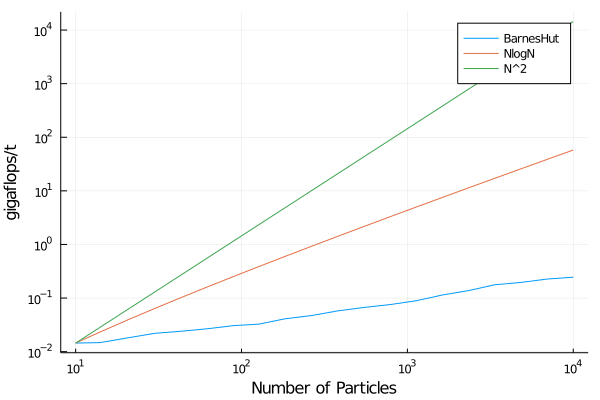

In [86]:
gt = gflops
nlogn = N.*log.(N)
normln = nlogn[1]/gt[1]
n2 = N.^2 
normn2 = n2[1]/gt[1]
plot(N, gt, label="BarnesHut", xaxis=:log, yaxis=:log, xlabel="Number of Particles", ylabel="gigaflops/t")
plot!(N, nlogn/normln, label="NlogN")
plot!(N, n2/normn2, label="N^2")
#savefig("gigaflops_vs_particles.pdf")

In [47]:
@show gflops

gflops = [0.014460511679644048, 0.014744124529453657, 0.018274931894663747, 0.022015047596192612, 0.023989988871565712, 0.026719924898747926, 0.03056845502805516, 0.032633493731718095, 0.041044196461903576, 0.047164522353394966, 0.05755445927049016, 0.06678022271338097, 0.07554872642439303, 0.08913493536054114, 0.11402179005202707, 0.13778494866135846, 0.17702585585366346, 0.19585081422466402, 0.22627139427587165, 0.24462814489966667]


20-element Array{Float64,1}:
 0.014460511679644048
 0.014744124529453657
 0.018274931894663747
 0.022015047596192612
 0.023989988871565712
 0.026719924898747926
 0.03056845502805516
 0.032633493731718095
 0.041044196461903576
 0.047164522353394966
 0.05755445927049016
 0.06678022271338097
 0.07554872642439303
 0.08913493536054114
 0.11402179005202707
 0.13778494866135846
 0.17702585585366346
 0.19585081422466402
 0.22627139427587165
 0.24462814489966667

## Energy conservation calculations
Used to benchmark our model

In [10]:
using LinearAlgebra
function KE(univ)
    #Kinetic Energy is Σ1/2mᵢvᵢ²
    mass = univ[:, 5]
    vx, vy = univ[:, 3], univ[:, 4]
    v² = vx .^ 2 .+ vy .^2
    KE = sum( 1/2 * mass .* v²)
    return KE
end

function PE(univ, soft)
    #Potential Energy is ΣGmᵢmⱼ/rᵢⱼ where i does not equal j
    x, y = univ[:, 1], univ[:, 2]
    dx = transpose(x) .- x
    dy = transpose(y) .- y
    mass = univ[:, 5]
    r = sqrt.(dx .^2 .+ dy .^2 .+ soft .^2)
    masses = transpose(mass).*mass #returns matrix of all mult combos.
    #to only count each mass pairing once and not the matrix 
    masses = UpperTriangular(masses)
    masses[diagind(masses)] .= 0
    PE = -g*sum(masses/r)
    return PE
end

PE (generic function with 1 method)

In [68]:
initial_KE = []
initial_PE = []
final_KE = []
final_PE = []
N = collect(range(0, 1, length=20))

@inbounds for n in N
    @show n
    univ_r = 1e18
    univ = create_bodies(316, univ_r, 3e4)
    init_KE = KE(univ)
    init_PE = PE(univ, 3e4)
    push!(initial_KE, init_KE)
    push!(initial_PE, init_PE)
    post = BarnesHut(univ, univ_r, 316, n, 1e11, 3e4, false)
    fin_KE = KE(post)
    fin_PE = PE(post, 3e4)
    push!(final_KE, fin_KE)
    push!(final_PE, fin_PE)
end


n = 0.0
n = 0.05263157894736842
n = 0.10526315789473684
n = 0.15789473684210525
n = 0.21052631578947367
n = 0.2631578947368421
n = 0.3157894736842105
n = 0.3684210526315789
n = 0.42105263157894735
n = 0.47368421052631576
n = 0.5263157894736842
n = 0.5789473684210527
n = 0.631578947368421
n = 0.6842105263157895
n = 0.7368421052631579
n = 0.7894736842105263
n = 0.8421052631578947
n = 0.8947368421052632
n = 0.9473684210526315
n = 1.0


In [79]:
using Plots
gr()
plot(N, (final_KE - initial_KE)./initial_KE, label="KE", xlabel = "\\theta", ylabel="\\Delta E/E", labelfontsize=11, legend=:bottomright, title="Conservation of Energy over \\theta (\\Delta t=1e11s)",titlefontsize=10)
plot!(N, (final_PE - initial_PE)./initial_PE, label="PE")
#plot!(N, final_KE, label="final KE")
#plot!(N, final_PE, label="final PE")
plot!(N, ((final_KE + final_PE) - (initial_KE + initial_PE))./(initial_KE+initial_PE), label="Total Energy")
savefig("conservation_theta.pdf")

## Dummy Universes for verifying box creation

In [45]:

using Plots
#import GR
gr()
#let's plot our octree to demonstrate what happened (and a first crack at traversing the tree)
p = Plots.scatter(fake_univ[: , 1], fake_univ[: , 2], xlim=(-univ_r, univ_r), ylim=(-univ_r, univ_r), 
    framestyle=:origin, legend = false, yformatter=y->round(Int64, y/univ_r), xformatter=x->round(Int64, x/univ_r), 
    size=(200,200), markershape=:star6, markersize=3)
#savefig("boxes_fakeuniv.pdf")

#gui()

rectangle(x, y, w, h) = Shape(x .+ [0,w,w,0], y .+ [0,0,h,h])

directions = ["NW", "NE", "SW", "SE"]
function PlotBoxes(dim_box, exs)
    for dir in directions
        if dim_box.parent == false
            x0, y0 = dim_box.SW
            wh = dim_box.NE[1] - x0
            Plots.plot!(exs, rectangle(x0, y0, wh, wh), line = (1, :green), fill = (0.001))
        else
            PlotBoxes(getproperty(dim_box, Symbol(dir)), exs)
        end
    end
end


PlotBoxes(dimensions_branch, p)
savefig("boxes_fakeuniv.png")


0.0:0.05263157894736842:1.0

In [ ]:
univ_r = 1e18
n_univ = create_bodies(1000, 1e18, 3e4)
#@show n_univ
#eps = 3e4
#fr = 10


#let's plot our octree to demonstrate what happened (and a first crack at traversing the tree)
p = scatter(fake_univ[: , 1], fake_univ[: , 2], xlim=(-univ_r, univ_r), ylim=(-univ_r, univ_r), framestyle=:origin, legend = false, 
    yformatter=y->round(Int64, y/univ_r), xformatter=x->round(Int64, x/univ_r))

rectangle(x, y, w, h) = Shape(x .+ [0,w,w,0], y .+ [0,0,h,h])

directions = ["NW", "NE", "SW", "SE"]
function PlotBoxes(dim_box, exs)
    @inbounds for dir in directions
        if dim_box.parent == false
            x0, y0 = dim_box.SW
            wh = dim_box.NE[1] - x0
            plot!(exs, rectangle(x0, y0, wh, wh), line = (1, :green), fill = (0.001))
        else
            PlotBoxes(getproperty(dim_box, Symbol(dir)), exs)
        end
    end
end

PlotBoxes(dimensions_branch, p)
p

